### Experiment : Train RNN variants using w2v skip gram embeddings and best performed paramters
### Objectives

1. Train LSTM model
2. Train GRU model
3. Train Bidirectional model
4. Error analysis on each variant

### Paramerters

RNN - Study statistics: 
  Number of finished trials:  50
Best trial:
  Value:  0.42832933606427764
  Params: 
    layers: 1
    units: 64
    dropout_rates: 0.3
    recurrent_dropout_rates: 0.1
    activation: swish
    spatial_dropout: False
    LR: 0.001

GRU -Study statistics: 
  Number of finished trials:  50
Best trial:
  Value:  0.3807172583165285
  Params: 
    layers: 1
    units: 32
    dropout_rates: 0.3
    recurrent_dropout_rates: 0.1
    activation: relu
    spatial_dropout: False
    LR: 0.001

LSTM - Trial 0 finished with value: 0.3973853744023683 and parameters: {'layers': 1, 'units': 32, 'dropout_rates': 0.3, 'recurrent_dropout_rates': 0.0, 'activation': 'elu', 'spatial_dropout': False, 'LR': 0.001}. Best is trial 0 with value: 0.3973853744023683.
 
BiGRU
 

### Observations

1. 
2. 
3. 

### Solutions and further investigation

1. 
2. 
3. 

#### Load Modeules and datasets

In [3]:
import numpy as np
import random as rn
np.random.seed(0)
rn.seed(0)
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_colwidth', 1000)
# import helper function script
import sys
sys.path.insert(1,'G:\\Github\\Sinhala-Hate-Speech-Detection')
import utills
import TextClassifier


#### Word2vec skipgram

In [4]:
TC = TextClassifier.TextClassifier(EMBEDDING=None)

Load data

X train (4526,) Y train (4526,) X test (1940,) Y test (1940,)
dictionary size:  17577


#### Custom code

In [6]:
def get_model(TC,model_type):
    from tensorflow.python.keras.models import Sequential
    #from tensorflow.keras.optimizers import Adam
    from tensorflow.python.keras.optimizer_v2.adam import Adam
    from tensorflow.python.keras.layers import Dense,Input,SpatialDropout1D,Dropout,Flatten, SimpleRNN,LSTM,RNN,GRU,Bidirectional,Embedding

    print("Build model")
    model = Sequential()
    if(TC.EMBEDDING == None):
        model.add(Embedding(output_dim=TC.EMBEDDING_SIZE, 
                        input_dim=TC.LEN_VOCAB, 
                        input_length=TC.MAX_SEQ_LEN,
                        trainable=TC.trainable))

    else:
        model.add(Embedding(output_dim=TC.EMBEDDING_SIZE, 
                        input_dim=TC.LEN_VOCAB, 
                        input_length=TC.MAX_SEQ_LEN,
                        weights=[TC.emb_matrix], # Additionally we give the Wi
                        trainable=TC.trainable)) # Don't train the embeddings 
   
    # if(spatial_dropout == True):
    #     model.add(SpatialDropout1D(dropout_rate))
    if(model_type=="RNN"):
        if TC.layer!=0:
            for i in range(TC.layer):
                model.add(SimpleRNN(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout,return_sequences=True))
        model.add(SimpleRNN(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout))

    elif(model_type == "LSTM"):
        if TC.layer!=0:
            for i in range(TC.layer):
                model.add(LSTM(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout,return_sequences=True))
        model.add(LSTM(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout))
    elif(model_type == "GRU"):
        if TC.layer!=0:
            for i in range(TC.layer):
                model.add(GRU(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout,return_sequences=True))
        model.add(GRU(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout))
    elif(model_type == "BiLSTM"):
        if TC.layer!=0:
            for i in range(TC.layer):
                model.add(Bidirectional(LSTM(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout,return_sequences=True)))
        model.add(Bidirectional(LSTM(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout)))
    elif(model_type == "BiGRU"):
        if TC.layer!=0:
            for i in range(TC.layer):
                model.add(Bidirectional(GRU(TC.unit, activation=TC.activation, dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout,return_sequences=True)))
        model.add(Bidirectional(GRU(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout)))
    #model.add(Dropout(0.2))
    if TC.layer!=0:
            for i in range(TC.layer):
                model.add(Dense(TC.unit, activation=TC.activation))
                model.add(Dropout(TC.dropout_rate))
    model.add(Dense(TC.unit, activation=TC.activation))
    model.add(Dropout(TC.dropout_rate))
    model.add(Dense(1,activation='sigmoid'))
    optimizer_adam = Adam(learning_rate=TC.lr)
    model.compile(loss='binary_crossentropy',
                optimizer=optimizer_adam,
                metrics=['acc'])
    model.summary()
    TC.model = model
    return model

In [20]:
def build_model(TC):
    from tensorflow.python.keras.models import Sequential
    from tensorflow.python.keras.optimizer_v2.adam import Adam
    from tensorflow.python.keras.layers import Dense,Input,SpatialDropout1D,Dropout,Flatten, SimpleRNN,LSTM,RNN,GRU,Bidirectional,GlobalMaxPool1D,Conv1D
    from tensorflow.python.keras.layers.embeddings import Embedding
    model = Sequential()
    if(TC.EMBEDDING == None):
        model.add(Embedding(output_dim=TC.EMBEDDING_SIZE, 
                        input_dim=TC.LEN_VOCAB, 
                        input_length=TC.MAX_SEQ_LEN,
                        trainable=TC.trainable))
    else:
        model.add(Embedding(output_dim=TC.EMBEDDING_SIZE, 
                            input_dim=TC.LEN_VOCAB, 
                            input_length=TC.MAX_SEQ_LEN,
                            weights=[TC.emb_matrix], # Additionally we give the Wi
                            trainable=TC.trainable)) # Don't train the embeddings - just use GloVe embedding
    #model.add(SpatialDropout1D(0.3))
    model.add(Bidirectional(GRU(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout,return_sequences=True)))
    model.add(Bidirectional(GRU(TC.unit, activation=TC.activation,dropout=TC.dropout_rate, recurrent_dropout=TC.recurr_dropout,return_sequences=True)))
    model.add(Conv1D(TC.unit, 4))
    model.add(GlobalMaxPool1D())
    model.add(Dense(TC.unit, activation=TC.activation))
    model.add(Dense(1,activation='sigmoid'))
    optimizer_adam = Adam(learning_rate=TC.lr)
    model.compile(loss='binary_crossentropy',
                optimizer=optimizer_adam,
                metrics=['acc'])
    print(model.summary())
    TC.model = model
    return model

In [ ]:
def predict_proba(arr,TC=TC):
    import numpy as np
    from tensorflow.python.keras.preprocessing import sequence
    pred=TC.model.predict(sequence.pad_sequences(TC.token.texts_to_sequences(arr),maxlen=TC.MAX_SEQ_LEN))
    returnable=[]
    for i in pred:
        temp=i[0]
        returnable.append(np.array([1-temp,temp]))
    return np.array(returnable)


def error_analysis(TC,model,Y_pred):
    import numpy as np
    from IPython.display import display
    import matplotlib.pyplot as plt
    import eli5
    from eli5.lime import TextExplainer
    import shap
    from lime.lime_text import LimeTextExplainer
    import tensorflow.compat.v1 as tf
    tf.disable_v2_behavior()
    from tensorflow.python.keras.preprocessing import sequence

    import tensorflow.keras.backend as K
    #token = Tokenizer(num_words=self.LEN_VOCAB)
    #token.fit_on_texts(self.X_tr)
    lime_explainer= LimeTextExplainer(class_names=[0,1])

    te = TextExplainer(random_state=0)
    distrib_samples = TC.X_train[:100]
    explainer = shap.DeepExplainer(model, distrib_samples)
    # explain the first 25 predictions
    # explaining each prediction requires 2 * background dataset size runs
    num_explanations = 25 #len(TC_F.X_test)
    shap_values = explainer.shap_values(TC.X_test[:num_explanations])
    shap.initjs()
    num2word = {}
    arr_index=TC.X_te.index
    for w in TC.word_index.keys():
        num2word[TC.word_index[w]] = w
    x_test_words = np.stack([np.array(list(map(lambda x: num2word.get(x, "NONE"), TC.X_test[i]))) for i in range(num_explanations)])
    i=0
    
    for s in TC.X_te:
        if(i==10):  # take 25 misclassified instances
            break
        if(TC.Y_test[arr_index[i]] != Y_pred[i]):
            print(s)
            print("Predicted Label : ",TC.result_map(Y_pred[i])," | Turth Label : ",TC.result_map(TC.Y_test[arr_index[i]]))
            te.fit(TC.X_te[arr_index[i]],predict_proba)
            shap.force_plot(explainer.expected_value[0], shap_values[0][i], x_test_words[i],matplotlib=True)
            display(te.show_prediction(target_names=[0,1]))
            display(lime_explainer.explain_instance(TC.X_te[arr_index[i]],predict_proba).show_in_notebook(text=True))
            i+=1
        print()

In [ ]:
TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna RNN random"
TC.activation = 
TC.recurr_dropout = 
TC.unit =
TC.layer = 
TC.dropout_rate = 

#### RNN

In [8]:
TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna RNN random"
TC.activation = 'relu'
TC.recurr_dropout = 0.1
TC.unit = 64
TC.layer = 1
TC.dropout_rate = 0.3

rnn_model = get_model(TC,"RNN")
rnn_model, hist = TC.train_model(rnn_model)

Build model
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 100, 300)          6000000   
_________________________________________________________________
simple_rnn (SimpleRNN)       (None, 100, 64)           23360     
_________________________________________________________________
simple_rnn_1 (SimpleRNN)     (None, 64)                8256      
_________________________________________________________________
dense (Dense)                (None, 64)                4160      
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                416

train loss -  0.5733354733520201  train acc-  0.6889085
test loss -  0.5887960129791928  test acc-  0.6886598
Train acc: 0.689, Test acc: 0.689


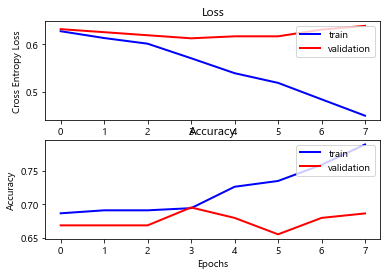

========= Eperiment -  optuna RNN random  =========


Info (NVML): NVML Shared Library Not Found. GPU usage metrics may not be reported. For more information, see https://docs-legacy.neptune.ai/logging-and-managing-experiment-results/logging-experiment-data.html#hardware-consumption 


https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-557


Invalid metric value: nan for channel positive_predictive_value. Metrics with nan or +/-inf values will not be sent to server
Invalid metric value: nan for channel false_discovery_rate. Metrics with nan or +/-inf values will not be sent to server


              precision    recall  f1-score   support

           0       0.69      1.00      0.82      1336
           1       0.00      0.00      0.00       604

    accuracy                           0.69      1940
   macro avg       0.34      0.50      0.41      1940
weighted avg       0.47      0.69      0.56      1940

Predicted     0
Actual         
0          1336
1           604


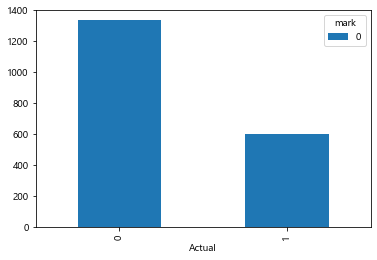

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Not Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ

In [9]:
# from keras.utils.vis_utils import plot_model
# plot_model(rnn_model, to_file='rnn_model_plot.png', show_shapes=True, show_layer_names=True)
Y_pred = TC.model_evaluate(rnn_model,hist)
TC.save_predictions(Y_pred,TC.tag)

In [ ]:
error_analysis(TC,rnn_model,Y_pred)

#### GRU
Study statistics: 

  Number of finished trials:  50
  
Best trial:

  Value:  0.3807172583165285
  Params: 
    layers: 1
    units: 32  try 64
    dropout_rates: 0.3
    recurrent_dropout_rates: 0.1
    activation: relu   try swish
    spatial_dropout: False
    LR: 0.001

In [10]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna GRU random"
TC.activation = 'relu'
TC.recurr_dropout = 0.1
TC.unit =32
TC.layer = 1
TC.dropout_rate = 0.3
gru_model = get_model(TC,"GRU")
gru_model, hist = TC.train_model(gru_model)

Build model
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 100, 300)          6000000   
_________________________________________________________________
gru (GRU)                    (None, 100, 32)           31968     
_________________________________________________________________
gru_1 (GRU)                  (None, 32)                6240      
_________________________________________________________________
dense_3 (Dense)              (None, 32)                1056      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 32)                1056      
_________________________________________________________________
dropout_3 (Dropout)          (None, 32)   

train loss -  0.33234148881786224  train acc-  0.8769333
test loss -  0.4738046987155049  test acc-  0.7814433
Train acc: 0.877, Test acc: 0.781


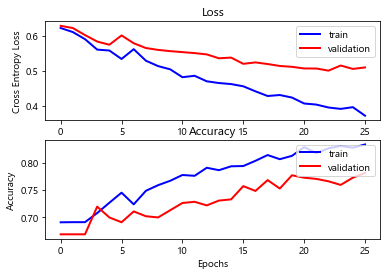

========= Eperiment -  optuna GRU random  =========
https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-558


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

              precision    recall  f1-score   support

           0       0.81      0.88      0.85      1336
           1       0.68      0.55      0.61       604

    accuracy                           0.78      1940
   macro avg       0.75      0.72      0.73      1940
weighted avg       0.77      0.78      0.77      1940

Predicted     0    1
Actual              
0          1181  155
1           269  335


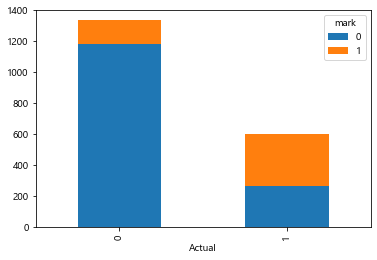

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ සෙට

In [11]:
# plot_model(gru_model, to_file='gru_model_plot.png', show_shapes=True, show_layer_names=True)
Y_pred = TC.model_evaluate(gru_model,hist)
TC.save_predictions(Y_pred,TC.tag)

In [ ]:
error_analysis(TC,gru_model,Y_pred)

#### LSTM

In [12]:
TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna LSTM random"
TC.activation = 'tanh'
TC.recurr_dropout = 0.0
TC.unit =32
TC.layer = 0
TC.dropout_rate = 0.1
lstm_model = get_model(TC,"LSTM")
lstm_model, hist = TC.train_model(lstm_model)

Build model
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 100, 300)          6000000   
_________________________________________________________________
lstm (LSTM)                  (None, 32)                42624     
_________________________________________________________________
dense_6 (Dense)              (None, 32)                1056      
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 33        
Total params: 6,043,713
Trainable params: 43,713
Non-trainable params: 6,000,000
_________________________________________________________________
started training
Train on 4073 samples, validate on 453 samples
Epoch 1/50

Epoch 00001: val_

train loss -  0.5198428122227138  train acc-  0.7503314
test loss -  0.5494743472522067  test acc-  0.73195875
Train acc: 0.750, Test acc: 0.732


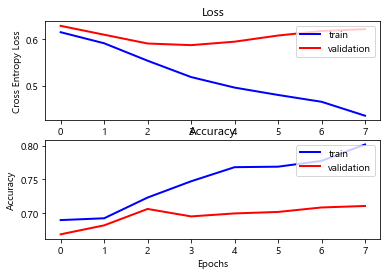

========= Eperiment -  optuna LSTM random  =========
https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-559
              precision    recall  f1-score   support

           0       0.74      0.94      0.83      1336
           1       0.67      0.27      0.39       604

    accuracy                           0.73      1940
   macro avg       0.71      0.61      0.61      1940
weighted avg       0.72      0.73      0.69      1940

Predicted     0    1
Actual              
0          1255   81
1           439  165


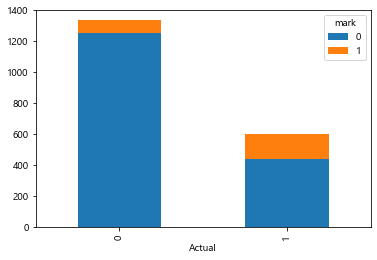

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Not Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ

In [13]:
Y_pred = TC.model_evaluate(lstm_model,hist)
TC.save_predictions(Y_pred,TC.tag)

In [ ]:
error_analysis(TC,lstm_model,Y_pred)

#### Bidirection LSTM

In [14]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna BiLSTM random"
TC.activation = 'tanh'
TC.recurr_dropout = 0.0
TC.unit =32
TC.layer = 0
TC.dropout_rate = 0.3
bilstm_model = get_model(TC,"BiLSTM")
bilstm_model, hist = TC.train_model(bilstm_model)

Build model
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 100, 300)          6000000   
_________________________________________________________________
bidirectional (Bidirectional (None, 64)                85248     
_________________________________________________________________
dense_8 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_5 (Dropout)          (None, 32)                0         
__________________

train loss -  0.512906332248826  train acc-  0.7547503
test loss -  0.520306384563446  test acc-  0.7515464
Train acc: 0.755, Test acc: 0.752


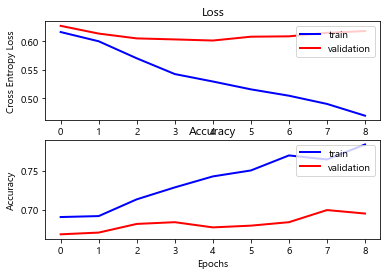

========= Eperiment -  optuna BiLSTM random  =========
https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-560
              precision    recall  f1-score   support

           0       0.76      0.94      0.84      1336
           1       0.72      0.33      0.45       604

    accuracy                           0.75      1940
   macro avg       0.74      0.64      0.65      1940
weighted avg       0.75      0.75      0.72      1940

Predicted     0    1
Actual              
0          1258   78
1           404  200


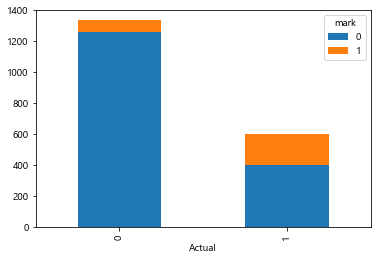

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Not Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ

In [15]:
Y_pred = TC.model_evaluate(bilstm_model,hist)
TC.save_predictions(Y_pred,TC.tag)

#### BiGRU

In [16]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna BiGRU random"
TC.activation = 'relu'
TC.recurr_dropout = 0.1
TC.unit =32
TC.layer = 1
TC.dropout_rate = 0.3
bigru_model = get_model(TC,"BiGRU")
bigru_model, hist = TC.train_model(bigru_model)

Build model
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, 100, 300)          6000000   
_________________________________________________________________
bidirectional_1 (Bidirection (None, 100, 64)           63936     
_________________________________________________________________
bidirectional_2 (Bidirection (None, 64)                18624     
_________________________________________________________________
dense_10 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_6 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_11 (Dense)             (None, 32)                1056      
_________________________________________________________________
dropout_7 (Dropout)          (None, 32)   

train loss -  0.3735771295879986  train acc-  0.8532921
test loss -  0.5021711069284026  test acc-  0.76804125
Train acc: 0.853, Test acc: 0.768


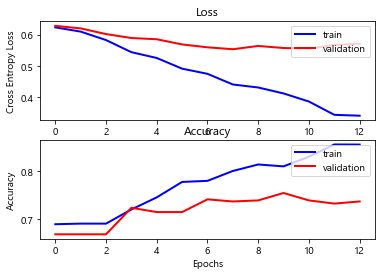

========= Eperiment -  optuna BiGRU random  =========
https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-561
              precision    recall  f1-score   support

           0       0.82      0.86      0.84      1336
           1       0.64      0.57      0.60       604

    accuracy                           0.77      1940
   macro avg       0.73      0.71      0.72      1940
weighted avg       0.76      0.77      0.76      1940

Predicted     0    1
Actual              
0          1146  190
1           260  344


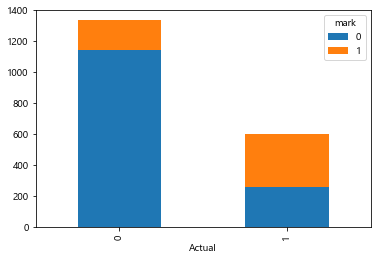

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Not Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ

In [17]:
# from keras.utils.vis_utils import plot_model
# plot_model(bigru_model, to_file='bigru_model_plot.png', show_shapes=True, show_layer_names=True)
Y_pred = TC.model_evaluate(bigru_model,hist)
TC.save_predictions(Y_pred,TC.tag)

#### BiDirectional LSTM + CNN

In [21]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna BiLSTM  CNN random"
TC.activation = 'tanh'
TC.recurr_dropout = 0.0
TC.unit =32
TC.layer = 0
TC.dropout_rate = 0.3
bilstmcnn_model = build_model(TC)
bilstmcnn_model, hist = TC.train_model(bilstmcnn_model)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 100, 300)          6000000   
_________________________________________________________________
bidirectional_3 (Bidirection (None, 100, 64)           63936     
_________________________________________________________________
bidirectional_4 (Bidirection (None, 100, 64)           18624     
_________________________________________________________________
conv1d (Conv1D)              (None, 97, 32)            8224      
_________________________________________________________________
global_max_pooling1d (Global (None, 32)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_14 (Dense)             (None, 1)                

Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into


Epoch 00001: val_loss improved from inf to 0.62047, saving model to G:/Github/Sinhala-Hate-Speech-Detection/trained_models/checkpoints/finetuned/optuna BiLSTM  CNN random\model.h5
4073/4073 - 54s - loss: 0.6169 - acc: 0.6902 - val_loss: 0.6205 - val_acc: 0.6689
Epoch 2/50

Epoch 00002: val_loss improved from 0.62047 to 0.56641, saving model to G:/Github/Sinhala-Hate-Speech-Detection/trained_models/checkpoints/finetuned/optuna BiLSTM  CNN random\model.h5
4073/4073 - 49s - loss: 0.5768 - acc: 0.7167 - val_loss: 0.5664 - val_acc: 0.7329
Epoch 3/50

Epoch 00003: val_loss improved from 0.56641 to 0.53683, saving model to G:/Github/Sinhala-Hate-Speech-Detection/trained_models/checkpoints/finetuned/optuna BiLSTM  CNN random\model.h5
4073/4073 - 52s - loss: 0.5329 - acc: 0.7439 - val_loss: 0.5368 - val_acc: 0.7550
Epoch 4/50

Epoch 00004: val_loss improved from 0.53683 to 0.52347, saving model to G:/Github/Sinhala-Hate-Speech-Detection/trained_models/checkpoints/finetuned/optuna BiLSTM  CNN r

train loss -  0.46704197905783207  train acc-  0.7923111
test loss -  0.5272801041603088  test acc-  0.7551546
Train acc: 0.792, Test acc: 0.755


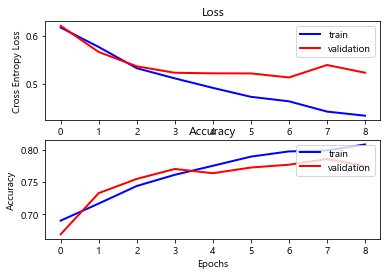

========= Eperiment -  optuna BiLSTM  CNN random  =========
https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-562
              precision    recall  f1-score   support

           0       0.77      0.93      0.84      1336
           1       0.70      0.37      0.48       604

    accuracy                           0.76      1940
   macro avg       0.73      0.65      0.66      1940
weighted avg       0.75      0.76      0.73      1940

Predicted     0    1
Actual              
0          1242   94
1           381  223


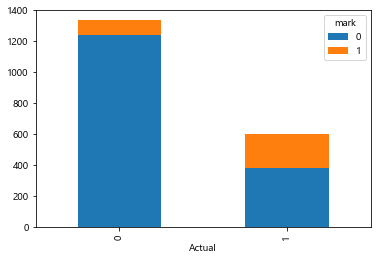

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Not Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ

In [22]:
Y_pred = TC.model_evaluate(bilstmcnn_model,hist)
TC.save_predictions(Y_pred,TC.tag)

#### BiGRU + CNN

In [23]:

TC.EPOCHS =50
TC.BATCH_SIZE =16
TC.lr = 0.001
TC.tag = "optuna BiGRU  CNN random"
TC.activation = 'relu'
TC.recurr_dropout = 0.1
TC.unit =32
TC.layer = 1
TC.dropout_rate = 0.3
grucnn_model = build_model(TC)
grucnn_model, hist = TC.train_model(grucnn_model)

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_6 (Embedding)      (None, 100, 300)          6000000   
_________________________________________________________________
bidirectional_5 (Bidirection (None, 100, 64)           63936     
_________________________________________________________________
bidirectional_6 (Bidirection (None, 100, 64)           18624     
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 97, 32)            8224      
_________________________________________________________________
global_max_pooling1d_1 (Glob (None, 32)                0         
_________________________________________________________________
dense_15 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_16 (Dense)             (None, 1)                

train loss -  0.29543161120922545  train acc-  0.8906319
test loss -  0.4751271601804753  test acc-  0.7953608
Train acc: 0.891, Test acc: 0.795


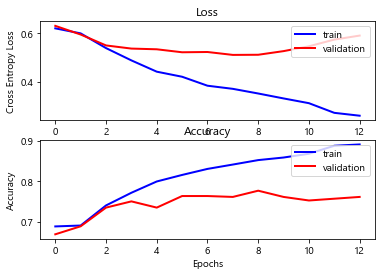

========= Eperiment -  optuna BiGRU  CNN random  =========
https://app.neptune.ai/codekcg23/Research-Experiments/e/RES-563


Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

              precision    recall  f1-score   support

           0       0.83      0.89      0.86      1336
           1       0.70      0.59      0.64       604

    accuracy                           0.80      1940
   macro avg       0.77      0.74      0.75      1940
weighted avg       0.79      0.80      0.79      1940

Predicted     0    1
Actual              
0          1185  151
1           246  358


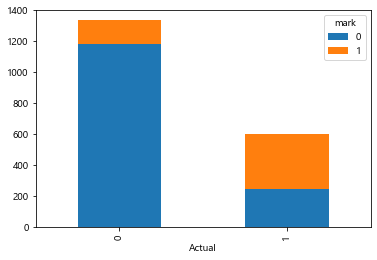

එන්න එන්න දැන් පරක්කු නෑ මුළ ටික හෙට එකෙන් අහමු ඊට පස්සේ ආයම
Predicted Label :  Not Hate  | Turth Label :  Not Hate

ඕකගේ ලාච්චුවේ දාපල්ලා නරුමයා
Predicted Label :  Not Hate  | Turth Label :  Hate

කන්න බොන්න දීලා කරට අත දාගෙන පිටිපස්සෙන් පිහියෙන් අනින සිස්ටම් එක තමයි පර්සි ලග තිබ්බෙ අන්තිමට පර්සි ලග හිටියා සුමනයා පර්සිටත් දුන්නෙ එවැනිම පාරක් තමයි හතර ගාතෙන් ඇදගෙන වැටෙන්න
Predicted Label :  Not Hate  | Turth Label :  Not Hate

කෝටි න් ගියත් ත්‍රී වීල් එකෙන් ගියත් යන්නෙ එකම පාරෙ නෙ බං කවදාහරි දවසක ඕකත් දිරලා වල පල්ලට යනවා කෝටි කින් කරන්න තව වැඩ කොච්චර නම් තියේද
Predicted Label :  Not Hate  | Turth Label :  Hate

ඒකි හිතන් ඇත්තේ අපිට පුපේ ඉත්තෑවෝ දුවනව කියලද දන්නෑ ෆේක් වලින් හරි ගිහින් එව්ව බලන්න
Predicted Label :  Not Hate  | Turth Label :  Hate

මේ තට්ටයව මුණ ගැහිලම විස්තරේ අහගනින් සියනෑවේ සිංහයා කියලා ඡන්දෙට ඉල්ලුවෙ සිංහයෙක් තියා හිවලෙක්වත් වෙන්න බෑ කියලා දැන් ඔප්පු වෙලා තියෙන්නෙ
Predicted Label :  Not Hate  | Turth Label :  Hate

සිවුරක් දමාගැනීම දමිත් අසංක පුක පෙන්වීම පිදුරංගල වීරයෝ

Unexpected error in ping thread.
Traceback (most recent call last):
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 672, in urlopen
    chunked=chunked,
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 421, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "C:\Users\Kavishka\anaconda3\lib\site-packages\urllib3\connectionpool.py", line 416, in _make_request
    httplib_response = conn.getresponse()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 1344, in getresponse
    response.begin()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 306, in begin
    version, status, reason = self._read_status()
  File "C:\Users\Kavishka\anaconda3\lib\http\client.py", line 267, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "C:\Users\Kavishka\anaconda3\lib\socket.py", line 589, in readinto
    return self._sock.recv_into

In [24]:
# from keras.utils.vis_utils import plot_model
# plot_model(grucnn_model, to_file='bigru_cnn_model_plot.png', show_shapes=True, show_layer_names=True)
Y_pred = TC.model_evaluate(grucnn_model,hist)
TC.save_predictions(Y_pred,TC.tag)